<a href="https://colab.research.google.com/github/fms-faisal/Impact-of-Digital-Image-Processing-on-Model-Performance/blob/main/DIP_implementation_part_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Median Filter**

Mounted at /content/drive
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Epoch 1 Train:   0%|           | 0/101 [00:00<?, ?it/s]<ipython-input-1-2e2d4c7e8fe1>:118: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9579  Acc: 0.7092


Val Loss: 0.9412  Acc: 0.7409

Epoch 2/10 ====================


Train Loss: 0.4515  Acc: 0.8620


Val Loss: 1.0831  Acc: 0.8015

Epoch 3/10 ====================


Train Loss: 0.2328  Acc: 0.9302


Val Loss: 0.8749  Acc: 0.8402

Epoch 4/10 ====================


Train Loss: 0.1996  Acc: 0.9382


Val Loss: 0.7268  Acc: 0.8668

Epoch 5/10 ====================


Train Loss: 0.1626  Acc: 0.9488


Val Loss: 0.9061  Acc: 0.8063

Epoch 6/10 ====================


Train Loss: 0.1220  Acc: 0.9614


Val Loss: 1.1979  Acc: 0.7893

Epoch 7/10 ====================


Train Loss: 0.1206  Acc: 0.9623


Val Loss: 0.9392  Acc: 0.8378

Epoch 8/10 ====================


Train Loss: 0.1287  Acc: 0.9589


Val Loss: 0.9497  Acc: 0.8232

Epoch 9/10 ====================


Train Loss: 0.1045  Acc: 0.9676


Val Loss: 1.2922  Acc: 0.8184

Epoch 10/10 ====================


Train Loss: 0.1112  Acc: 0.9655


Val Loss: 0.7630  Acc: 0.8475

Training complete in 4m 55s
Best validation accuracy: 0.8668



--- Test Metrics ---
Test Accuracy : 0.9103
Precision     : 0.9174
Recall        : 0.9103
F1 Score      : 0.9066

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.88      0.75      0.81        20
                  Black Hairy       0.91      1.00      0.95        20
                      Cutworm       0.95      0.95      0.95        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.78      0.64      0.70        22
                   Jute Hairy       0.95      0.95      0.95        20
                Jute Red Mite       0.95      0.88      0.91        24
              Jute Semilooper       0.91      0.48      0.62        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.96      0.96      0.96        24
                  Leaf Beetle       1.00      0.96      0.98        24
         

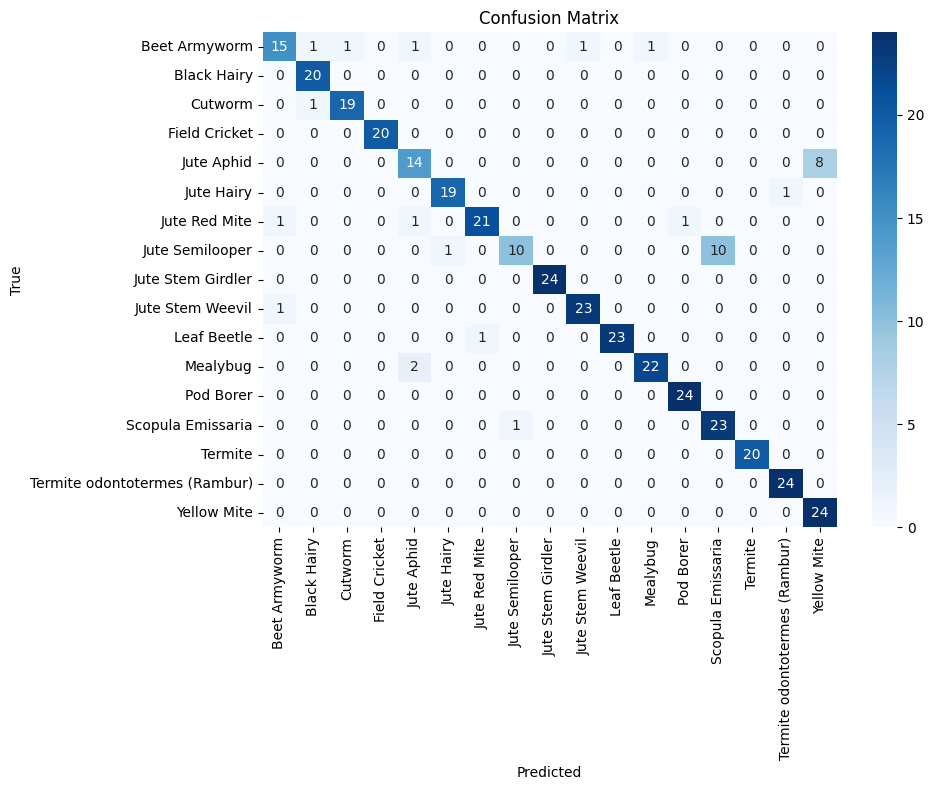


--- Sample Predictions from Median Filtered Training Dataset ---


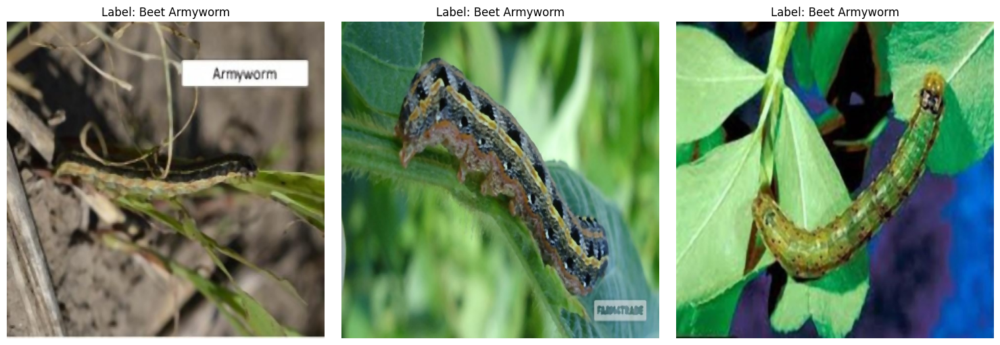

In [ ]:
# Google Colab: Mount Drive (only for copying original dataset)
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
MEDIAN_DATASET_DIR = '/content/jute_pest_dataset_median_filtered'  # Store median-filtered dataset locally
BASE_DIR = "/content/jute_pest_dataset"  # Local directory for original dataset

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply median filter (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

MEDIAN_TRAIN_DIR = os.path.join(MEDIAN_DATASET_DIR, "train")
MEDIAN_VAL_DIR = os.path.join(MEDIAN_DATASET_DIR, "val")
MEDIAN_TEST_DIR = os.path.join(MEDIAN_DATASET_DIR, "test")

os.makedirs(MEDIAN_TRAIN_DIR, exist_ok=True)
os.makedirs(MEDIAN_VAL_DIR, exist_ok=True)
os.makedirs(MEDIAN_TEST_DIR, exist_ok=True)

def apply_median_filter(source_dir, target_dir):
    for class_name in os.listdir(source_dir):
        class_dir = os.path.join(source_dir, class_name)
        if os.path.isdir(class_dir):
            median_class_dir = os.path.join(target_dir, class_name)
            os.makedirs(median_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    median_img = cv2.medianBlur(img, 5)  # Apply median filter with kernel size 5
                    cv2.imwrite(os.path.join(median_class_dir, img_name), median_img)

apply_median_filter(TRAIN_DIR, MEDIAN_TRAIN_DIR)
apply_median_filter(VAL_DIR, MEDIAN_VAL_DIR)
apply_median_filter(TEST_DIR, MEDIAN_TEST_DIR)

assert os.path.exists(MEDIAN_TRAIN_DIR)
assert os.path.exists(MEDIAN_VAL_DIR)
assert os.path.exists(MEDIAN_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase],
                        desc=f"Epoch {epoch+1} {phase.capitalize()}",
                        leave=False,
                        dynamic_ncols=True,
                        mininterval=1.0,
                        bar_format='{l_bar}{bar} | {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]')
            for inputs, labels in pbar:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                optimizer.zero_grad(set_to_none=True)
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_median.pth"))
            pbar.close()
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main Code
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(MEDIAN_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(MEDIAN_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True,
                            persistent_workers=True, prefetch_factor=4),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True,
                          persistent_workers=True, prefetch_factor=4),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True,
                           persistent_workers=True, prefetch_factor=4)
    }

    # === AlexNet Model ===
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_median.pth"))

    # === Test Phase ===
    model.eval()
    test_results = []
    all_preds = []
    all_labels = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing", leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_median.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_median.png"))
    plt.show()

    # Show sample predictions from median filtered training dataset
    print("\n--- Sample Predictions from Median Filtered Training Dataset ---")
    median_train_dataset = JutePestDataset(MEDIAN_TRAIN_DIR, transform=data_transforms["train"])
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, ax in enumerate(axes):
        img_path, label = median_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {median_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_predictions_median_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_median.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Second Order Derivative Filtering**

Mounted at /content/drive
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-1-165a5b0bba3b>:115: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.0387  Acc: 0.6805


Val Loss: 1.0609  Acc: 0.7191

Epoch 2/10 ====================


Train Loss: 0.5809  Acc: 0.8205


Val Loss: 0.8007  Acc: 0.7845

Epoch 3/10 ====================


Train Loss: 0.3259  Acc: 0.8996


Val Loss: 0.8531  Acc: 0.7845

Epoch 4/10 ====================


Train Loss: 0.2622  Acc: 0.9178


Val Loss: 1.2907  Acc: 0.7288

Epoch 5/10 ====================


Train Loss: 0.1834  Acc: 0.9441


Val Loss: 0.8558  Acc: 0.8160

Epoch 6/10 ====================


Train Loss: 0.1543  Acc: 0.9527


Val Loss: 0.7859  Acc: 0.8426

Epoch 7/10 ====================


Train Loss: 0.1278  Acc: 0.9620


Val Loss: 1.0017  Acc: 0.8184

Epoch 8/10 ====================


Train Loss: 0.1312  Acc: 0.9601


Val Loss: 0.8246  Acc: 0.8741

Epoch 9/10 ====================


Train Loss: 0.1304  Acc: 0.9600


Val Loss: 0.9513  Acc: 0.8329

Epoch 10/10 ====================


Train Loss: 0.0955  Acc: 0.9704


Val Loss: 0.9368  Acc: 0.7966

Training complete in 5m 24s
Best validation accuracy: 0.8741


Testing: 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]



--- Test Metrics ---
Test Accuracy : 0.9050
Precision     : 0.9133
Recall        : 0.9050
F1 Score      : 0.8978

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.89      0.40      0.55        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       0.82      0.90      0.86        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.78      0.82      0.80        22
                   Jute Hairy       0.95      1.00      0.98        20
                Jute Red Mite       0.87      0.83      0.85        24
              Jute Semilooper       0.91      0.48      0.62        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.96      0.98        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

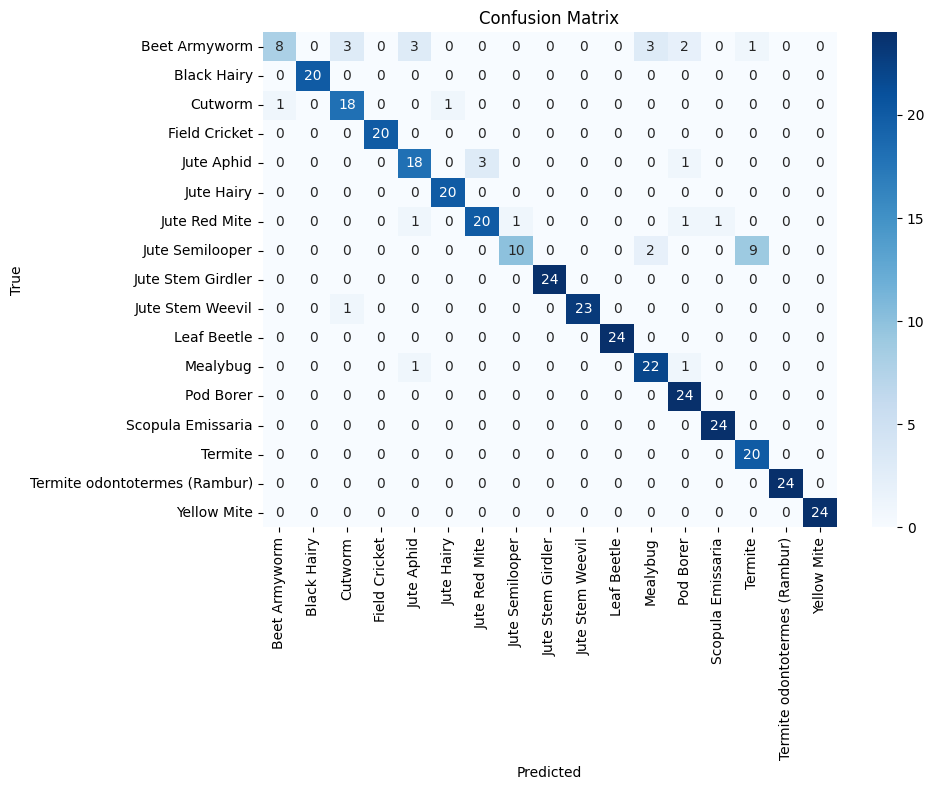


--- Sample Training Images After Laplacian Sharpening ---


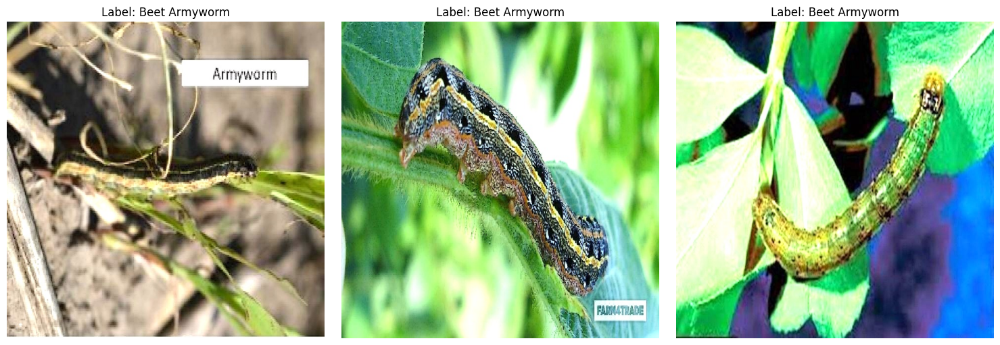

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
LAPLACIAN_DATASET_DIR = '/content/jute_pest_dataset_laplacian'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Laplacian sharpening (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

LAPLACIAN_TRAIN_DIR = os.path.join(LAPLACIAN_DATASET_DIR, "train")
LAPLACIAN_VAL_DIR = os.path.join(LAPLACIAN_DATASET_DIR, "val")
LAPLACIAN_TEST_DIR = os.path.join(LAPLACIAN_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(LAPLACIAN_TRAIN_DIR, exist_ok=True)
os.makedirs(LAPLACIAN_VAL_DIR, exist_ok=True)
os.makedirs(LAPLACIAN_TEST_DIR, exist_ok=True)

# Function to apply Laplacian sharpening
def apply_laplacian_sharpening(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            laplacian_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(laplacian_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
                    laplacian = cv2.convertScaleAbs(laplacian)
                    sharpened = cv2.addWeighted(img, 1.5, cv2.cvtColor(laplacian, cv2.COLOR_GRAY2BGR), -0.5, 0)
                    cv2.imwrite(os.path.join(laplacian_class_dir, img_name), sharpened)

# Apply Laplacian sharpening to training, validation, and test sets
apply_laplacian_sharpening(TRAIN_DIR, LAPLACIAN_TRAIN_DIR)
apply_laplacian_sharpening(VAL_DIR, LAPLACIAN_VAL_DIR)
apply_laplacian_sharpening(TEST_DIR, LAPLACIAN_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_laplacian.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(LAPLACIAN_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(LAPLACIAN_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(LAPLACIAN_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_laplacian.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_laplacian.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_laplacian.png"))
    plt.show()

    # Show sample predictions from Laplacian training dataset
    print("\n--- Sample Training Images After Laplacian Sharpening ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    laplacian_train_dataset = JutePestDataset(LAPLACIAN_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = laplacian_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {laplacian_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_laplacian_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_laplacian.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Thresholding**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-2-23adea506732>:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 2.8495  Acc: 0.0925


Val Loss: 2.7900  Acc: 0.1671

Epoch 2/10 ====================


Train Loss: 2.7525  Acc: 0.1079


Val Loss: 2.7369  Acc: 0.1671

Epoch 3/10 ====================


Train Loss: 2.7104  Acc: 0.1227


Val Loss: 2.7010  Acc: 0.1308

Epoch 4/10 ====================


Train Loss: 2.6680  Acc: 0.1353


Val Loss: 2.6564  Acc: 0.1864

Epoch 5/10 ====================


Train Loss: 2.6042  Acc: 0.1702


Val Loss: 2.5323  Acc: 0.2470

Epoch 6/10 ====================


Train Loss: 2.3782  Acc: 0.2536


Val Loss: 2.5260  Acc: 0.2421

Epoch 7/10 ====================


Train Loss: 2.0916  Acc: 0.3439


Val Loss: 2.1088  Acc: 0.3801

Epoch 8/10 ====================


Train Loss: 1.7770  Acc: 0.4477


Val Loss: 2.0286  Acc: 0.3947

Epoch 9/10 ====================


Train Loss: 1.4754  Acc: 0.5473


Val Loss: 1.7824  Acc: 0.4697

Epoch 10/10 ====================


Train Loss: 1.1980  Acc: 0.6316


Val Loss: 1.8816  Acc: 0.5351

Training complete in 4m 49s
Best validation accuracy: 0.5351


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



--- Test Metrics ---
Test Accuracy : 0.5409
Precision     : 0.5846
Recall        : 0.5409
F1 Score      : 0.5347

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.59      0.50      0.54        20
                  Black Hairy       0.50      0.70      0.58        20
                      Cutworm       1.00      0.35      0.52        20
                Field Cricket       0.54      0.65      0.59        20
                   Jute Aphid       0.24      0.41      0.30        22
                   Jute Hairy       0.73      0.40      0.52        20
                Jute Red Mite       0.27      0.12      0.17        24
              Jute Semilooper       0.23      0.14      0.18        21
            Jute Stem Girdler       0.95      0.79      0.86        24
             Jute Stem Weevil       0.44      0.92      0.59        24
                  Leaf Beetle       0.71      0.62      0.67        24
         

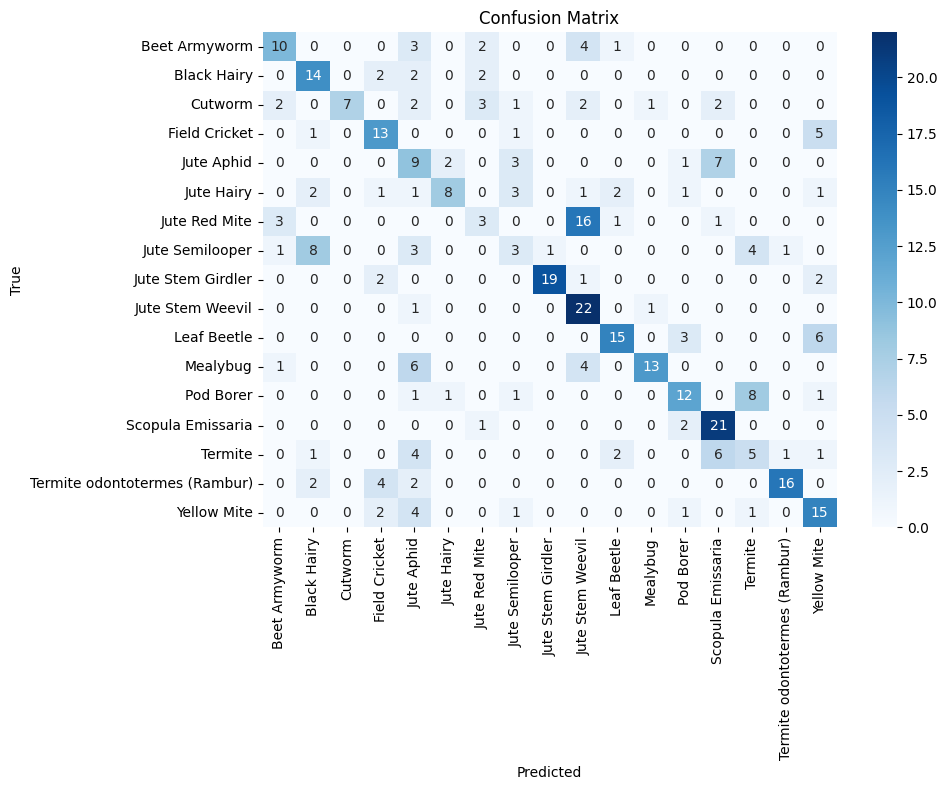


--- Sample Training Images After Thresholding ---


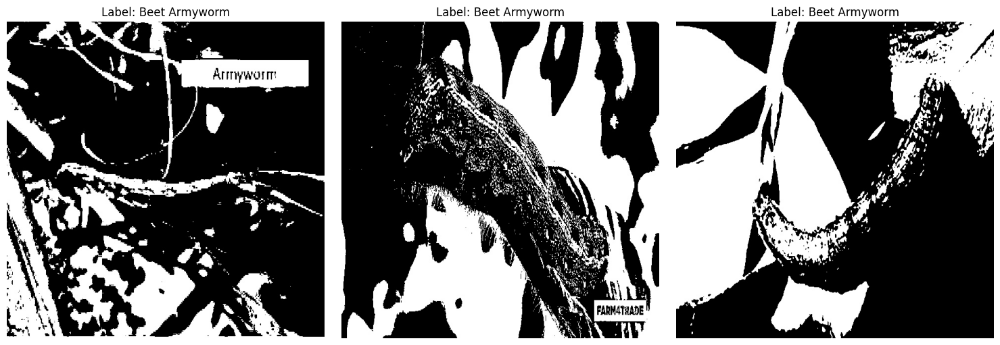

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
THRESHOLD_DATASET_DIR = '/content/jute_pest_dataset_threshold'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Thresholding (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

THRESHOLD_TRAIN_DIR = os.path.join(THRESHOLD_DATASET_DIR, "train")
THRESHOLD_VAL_DIR = os.path.join(THRESHOLD_DATASET_DIR, "val")
THRESHOLD_TEST_DIR = os.path.join(THRESHOLD_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(THRESHOLD_TRAIN_DIR, exist_ok=True)
os.makedirs(THRESHOLD_VAL_DIR, exist_ok=True)
os.makedirs(THRESHOLD_TEST_DIR, exist_ok=True)

# Function to apply Thresholding
def apply_thresholding(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            threshold_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(threshold_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)
                    thresh_color = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)
                    cv2.imwrite(os.path.join(threshold_class_dir, img_name), thresh_color)

# Apply Thresholding to training, validation, and test sets
apply_thresholding(TRAIN_DIR, THRESHOLD_TRAIN_DIR)
apply_thresholding(VAL_DIR, THRESHOLD_VAL_DIR)
apply_thresholding(TEST_DIR, THRESHOLD_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_threshold.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(THRESHOLD_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(THRESHOLD_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(THRESHOLD_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_threshold.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_threshold.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_threshold.png"))
    plt.show()

    # Show sample predictions from Thresholding training dataset
    print("\n--- Sample Training Images After Thresholding ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    threshold_train_dataset = JutePestDataset(THRESHOLD_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = threshold_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {threshold_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_threshold_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_threshold.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Dilation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-3-287c3b98f48d>:116: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 3.0436  Acc: 0.0957


Val Loss: 2.8276  Acc: 0.1719

Epoch 2/10 ====================


Train Loss: 2.8006  Acc: 0.1002


Val Loss: 2.8069  Acc: 0.1719

Epoch 3/10 ====================


Train Loss: 2.7988  Acc: 0.1051


Val Loss: 2.8152  Acc: 0.1719

Epoch 4/10 ====================


Train Loss: 2.7985  Acc: 0.1049


Val Loss: 2.8033  Acc: 0.1719

Epoch 5/10 ====================


Train Loss: 2.7983  Acc: 0.1049


Val Loss: 2.7956  Acc: 0.1719

Epoch 6/10 ====================


Train Loss: 2.7979  Acc: 0.1049


Val Loss: 2.7927  Acc: 0.1719

Epoch 7/10 ====================


Train Loss: 2.7980  Acc: 0.1049


Val Loss: 2.8007  Acc: 0.1719

Epoch 8/10 ====================


Train Loss: 2.7978  Acc: 0.1049


Val Loss: 2.8012  Acc: 0.1719

Epoch 9/10 ====================


Train Loss: 2.7973  Acc: 0.1049


Val Loss: 2.8063  Acc: 0.1719

Epoch 10/10 ====================


Train Loss: 2.7974  Acc: 0.1049


Val Loss: 2.7840  Acc: 0.1719

Training complete in 4m 45s
Best validation accuracy: 0.1719


Testing: 100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



--- Test Metrics ---
Test Accuracy : 0.0633
Precision     : 0.0040
Recall        : 0.0633
F1 Score      : 0.0075

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.00      0.00      0.00        20
                  Black Hairy       0.00      0.00      0.00        20
                      Cutworm       0.00      0.00      0.00        20
                Field Cricket       0.00      0.00      0.00        20
                   Jute Aphid       0.00      0.00      0.00        22
                   Jute Hairy       0.00      0.00      0.00        20
                Jute Red Mite       0.00      0.00      0.00        24
              Jute Semilooper       0.00      0.00      0.00        21
            Jute Stem Girdler       0.00      0.00      0.00        24
             Jute Stem Weevil       0.06      1.00      0.12        24
                  Leaf Beetle       0.00      0.00      0.00        24
         

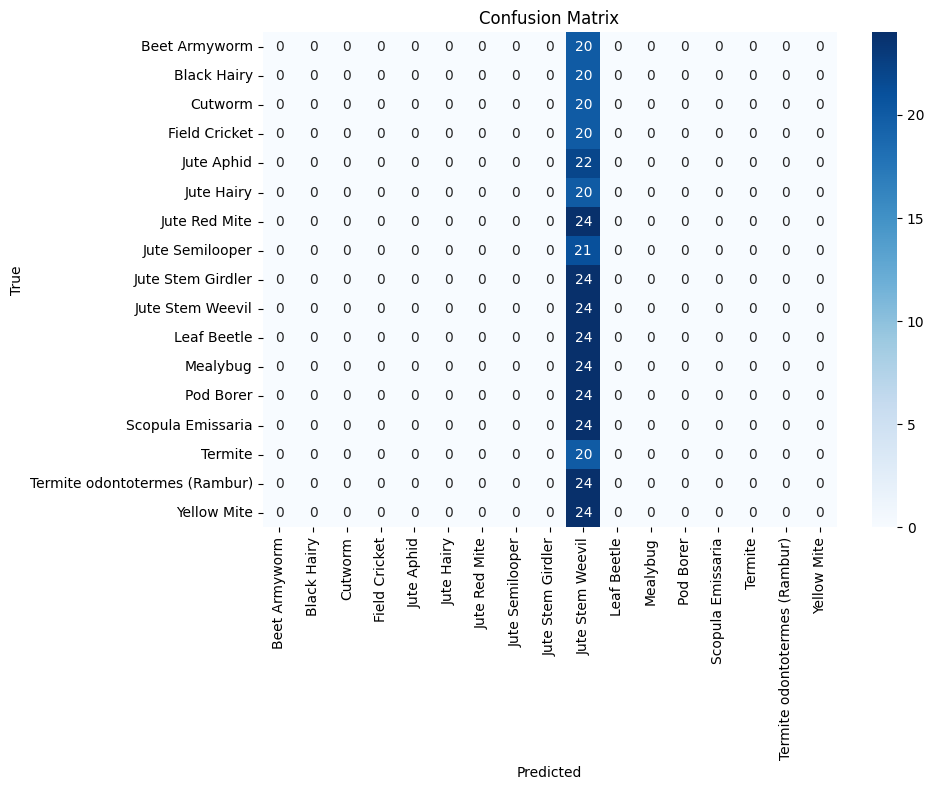


--- Sample Training Images After Dilation ---


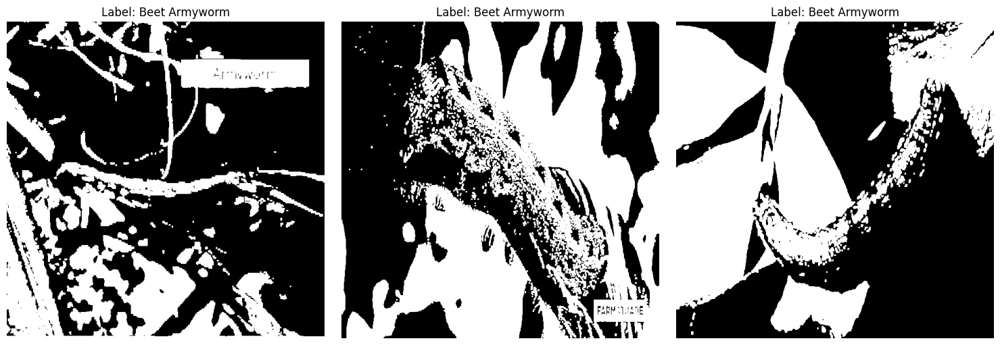

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
DILATION_DATASET_DIR = '/content/jute_pest_dataset_dilation'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Dilation (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

DILATION_TRAIN_DIR = os.path.join(DILATION_DATASET_DIR, "train")
DILATION_VAL_DIR = os.path.join(DILATION_DATASET_DIR, "val")
DILATION_TEST_DIR = os.path.join(DILATION_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(DILATION_TRAIN_DIR, exist_ok=True)
os.makedirs(DILATION_VAL_DIR, exist_ok=True)
os.makedirs(DILATION_TEST_DIR, exist_ok=True)

# Function to apply Dilation
def apply_dilation(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            dilation_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(dilation_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)
                    dilation = cv2.dilate(thresh, kernel, iterations=1)
                    dilation_color = cv2.cvtColor(dilation, cv2.COLOR_GRAY2BGR)
                    cv2.imwrite(os.path.join(dilation_class_dir, img_name), dilation_color)

# Apply Dilation to training, validation, and test sets
apply_dilation(TRAIN_DIR, DILATION_TRAIN_DIR)
apply_dilation(VAL_DIR, DILATION_VAL_DIR)
apply_dilation(TEST_DIR, DILATION_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_dilation.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(DILATION_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(DILATION_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(DILATION_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_dilation.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_dilation.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_dilation.png"))
    plt.show()

    # Show sample predictions from Dilation training dataset
    print("\n--- Sample Training Images After Dilation ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    dilation_train_dataset = JutePestDataset(DILATION_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = dilation_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {dilation_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_dilation_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_dilation.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Dilation RGB**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-2-0c991b51e6a7>:120: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9654  Acc: 0.6986


Val Loss: 1.0135  Acc: 0.7385

Epoch 2/10 ====================


Train Loss: 0.4710  Acc: 0.8524


Val Loss: 0.9675  Acc: 0.7869

Epoch 3/10 ====================


Train Loss: 0.3171  Acc: 0.9008


Val Loss: 0.7482  Acc: 0.7990

Epoch 4/10 ====================


Train Loss: 0.2255  Acc: 0.9308


Val Loss: 0.9267  Acc: 0.8281

Epoch 5/10 ====================


Train Loss: 0.1449  Acc: 0.9556


Val Loss: 0.8321  Acc: 0.8378

Epoch 6/10 ====================


Train Loss: 0.1468  Acc: 0.9583


Val Loss: 0.9106  Acc: 0.8257

Epoch 7/10 ====================


Train Loss: 0.1274  Acc: 0.9573


Val Loss: 0.9735  Acc: 0.8136

Epoch 8/10 ====================


Train Loss: 0.1068  Acc: 0.9674


Val Loss: 1.0259  Acc: 0.8111

Epoch 9/10 ====================


Train Loss: 0.1151  Acc: 0.9646


Val Loss: 0.8905  Acc: 0.8378

Epoch 10/10 ====================


Train Loss: 0.0830  Acc: 0.9752


Val Loss: 0.8361  Acc: 0.8354

Training complete in 5m 22s
Best validation accuracy: 0.8378


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]



--- Test Metrics ---
Test Accuracy : 0.9525
Precision     : 0.9547
Recall        : 0.9525
F1 Score      : 0.9512

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.94      0.75      0.83        20
                  Black Hairy       0.91      1.00      0.95        20
                      Cutworm       0.95      0.95      0.95        20
                Field Cricket       1.00      0.95      0.97        20
                   Jute Aphid       0.95      0.82      0.88        22
                   Jute Hairy       0.90      0.95      0.93        20
                Jute Red Mite       1.00      0.79      0.88        24
              Jute Semilooper       0.95      1.00      0.98        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.92      1.00      0.96        24
                  Leaf Beetle       0.92      1.00      0.96        24
         

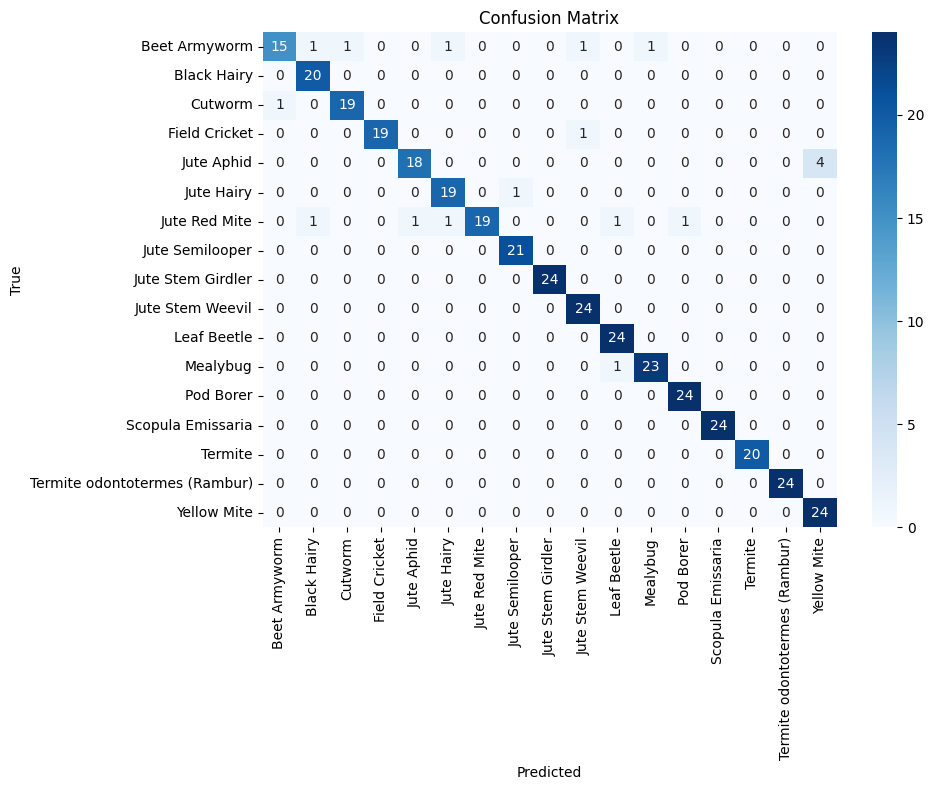


--- Sample Training Images After Dilation ---


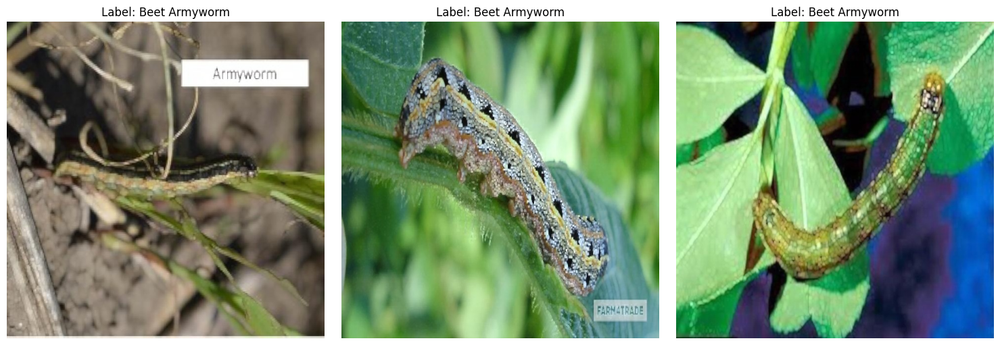

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
DILATION_DATASET_DIR = '/content/jute_pest_dataset_dilation'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Dilation (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

DILATION_TRAIN_DIR = os.path.join(DILATION_DATASET_DIR, "train")
DILATION_VAL_DIR = os.path.join(DILATION_DATASET_DIR, "val")
DILATION_TEST_DIR = os.path.join(DILATION_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(DILATION_TRAIN_DIR, exist_ok=True)
os.makedirs(DILATION_VAL_DIR, exist_ok=True)
os.makedirs(DILATION_TEST_DIR, exist_ok=True)

# Function to apply RGB Dilation
def apply_dilation(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            dilation_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(dilation_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Split the image into its RGB channels
                    b, g, r = cv2.split(img)
                    # Apply dilation to each channel
                    b_dilated = cv2.dilate(b, kernel, iterations=1)
                    g_dilated = cv2.dilate(g, kernel, iterations=1)
                    r_dilated = cv2.dilate(r, kernel, iterations=1)
                    # Merge the dilated channels back into an RGB image
                    dilation_color = cv2.merge((b_dilated, g_dilated, r_dilated))
                    cv2.imwrite(os.path.join(dilation_class_dir, img_name), dilation_color)

# Apply Dilation to training, validation, and test sets
apply_dilation(TRAIN_DIR, DILATION_TRAIN_DIR)
apply_dilation(VAL_DIR, DILATION_VAL_DIR)
apply_dilation(TEST_DIR, DILATION_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_dilation.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(DILATION_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(DILATION_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(DILATION_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_dilation.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_dilation.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_dilation.png"))
    plt.show()

    # Show sample predictions from Dilation training dataset
    print("\n--- Sample Training Images After Dilation ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    dilation_train_dataset = JutePestDataset(DILATION_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = dilation_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {dilation_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_dilation_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_dilation.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Erosion**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-4-d66e92d882c3>:116: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 2.8147  Acc: 0.1063


Val Loss: 2.7304  Acc: 0.1550

Epoch 2/10 ====================


Train Loss: 2.7217  Acc: 0.1271


Val Loss: 2.5283  Acc: 0.2397

Epoch 3/10 ====================


Train Loss: 2.2945  Acc: 0.2767


Val Loss: 1.9924  Acc: 0.4019

Epoch 4/10 ====================


Train Loss: 1.7399  Acc: 0.4541


Val Loss: 1.7523  Acc: 0.4770

Epoch 5/10 ====================


Train Loss: 1.3760  Acc: 0.5647


Val Loss: 1.6771  Acc: 0.5714

Epoch 6/10 ====================


Train Loss: 1.1704  Acc: 0.6266


Val Loss: 1.6350  Acc: 0.5690

Epoch 7/10 ====================


Train Loss: 0.9672  Acc: 0.6904


Val Loss: 1.5851  Acc: 0.5617

Epoch 8/10 ====================


Train Loss: 0.8363  Acc: 0.7354


Val Loss: 1.4608  Acc: 0.6005

Epoch 9/10 ====================


Train Loss: 0.6630  Acc: 0.7885


Val Loss: 1.4697  Acc: 0.6053

Epoch 10/10 ====================


Train Loss: 0.6463  Acc: 0.7958


Val Loss: 1.5324  Acc: 0.6199

Training complete in 4m 47s
Best validation accuracy: 0.6199


Testing: 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]



--- Test Metrics ---
Test Accuracy : 0.7177
Precision     : 0.7438
Recall        : 0.7177
F1 Score      : 0.7165

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.62      0.65      0.63        20
                  Black Hairy       0.95      0.90      0.92        20
                      Cutworm       0.92      0.55      0.69        20
                Field Cricket       0.62      1.00      0.77        20
                   Jute Aphid       0.39      0.59      0.47        22
                   Jute Hairy       0.67      0.40      0.50        20
                Jute Red Mite       0.71      0.42      0.53        24
              Jute Semilooper       0.58      0.67      0.62        21
            Jute Stem Girdler       0.92      0.96      0.94        24
             Jute Stem Weevil       0.55      0.71      0.62        24
                  Leaf Beetle       0.70      0.88      0.78        24
         

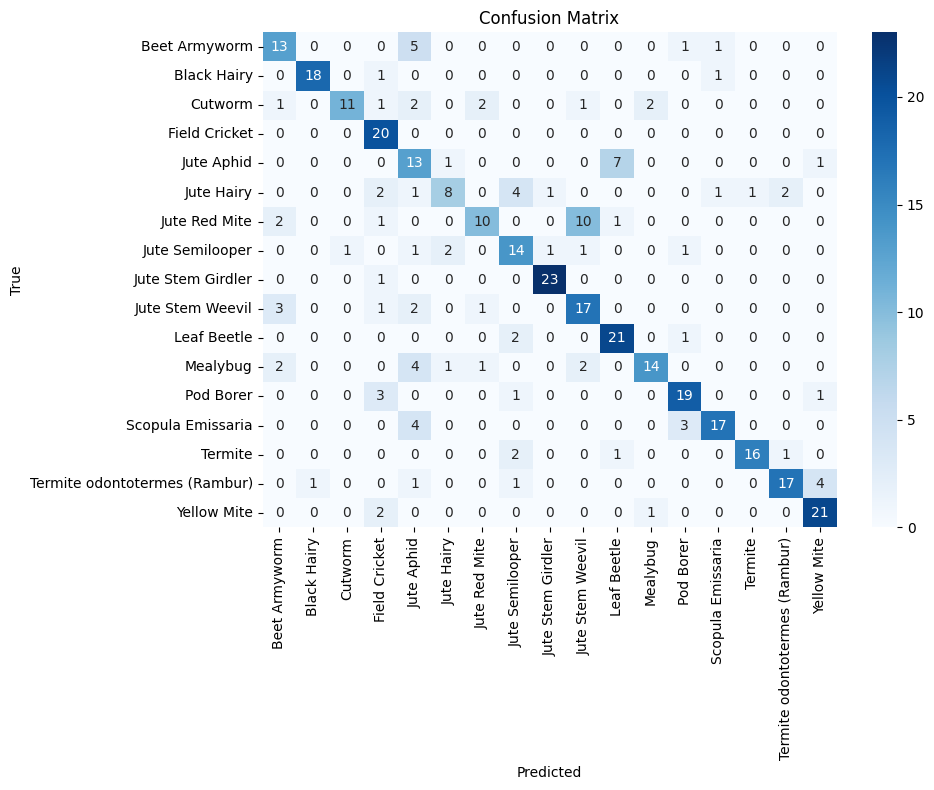


--- Sample Training Images After Erosion ---


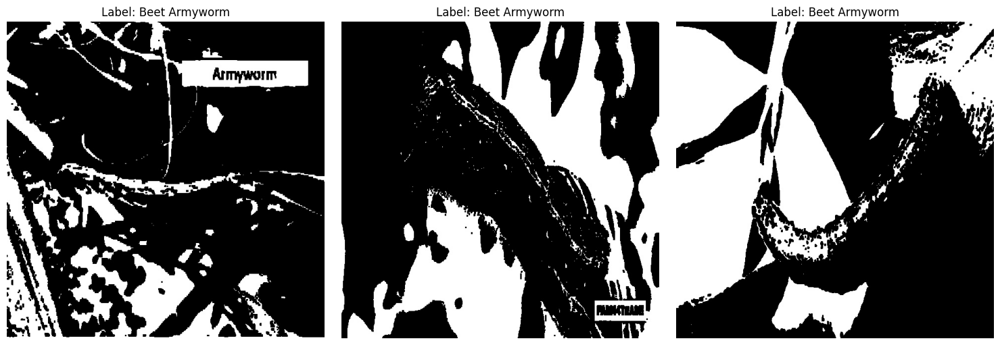

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
EROSION_DATASET_DIR = '/content/jute_pest_dataset_erosion'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Erosion (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

EROSION_TRAIN_DIR = os.path.join(EROSION_DATASET_DIR, "train")
EROSION_VAL_DIR = os.path.join(EROSION_DATASET_DIR, "val")
EROSION_TEST_DIR = os.path.join(EROSION_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(EROSION_TRAIN_DIR, exist_ok=True)
os.makedirs(EROSION_VAL_DIR, exist_ok=True)
os.makedirs(EROSION_TEST_DIR, exist_ok=True)

# Function to apply Erosion
def apply_erosion(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            erosion_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(erosion_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)
                    erosion = cv2.erode(thresh, kernel, iterations=1)
                    erosion_color = cv2.cvtColor(erosion, cv2.COLOR_GRAY2BGR)
                    cv2.imwrite(os.path.join(erosion_class_dir, img_name), erosion_color)

# Apply Erosion to training, validation, and test sets
apply_erosion(TRAIN_DIR, EROSION_TRAIN_DIR)
apply_erosion(VAL_DIR, EROSION_VAL_DIR)
apply_erosion(TEST_DIR, EROSION_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_erosion.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(EROSION_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(EROSION_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(EROSION_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_erosion.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_erosion.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_erosion.png"))
    plt.show()

    # Show sample predictions from Erosion training dataset
    print("\n--- Sample Training Images After Erosion ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    erosion_train_dataset = JutePestDataset(EROSION_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = erosion_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {erosion_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_erosion_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_erosion.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Erosion RGB**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-5-642a34c183a6>:120: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9666  Acc: 0.7059


Val Loss: 1.1011  Acc: 0.7070

Epoch 2/10 ====================


Train Loss: 0.4446  Acc: 0.8650


Val Loss: 0.7911  Acc: 0.7772

Epoch 3/10 ====================


Train Loss: 0.2523  Acc: 0.9235


Val Loss: 0.9030  Acc: 0.8039

Epoch 4/10 ====================


Train Loss: 0.2110  Acc: 0.9306


Val Loss: 0.8250  Acc: 0.8354

Epoch 5/10 ====================


Train Loss: 0.1832  Acc: 0.9462


Val Loss: 0.8219  Acc: 0.8378

Epoch 6/10 ====================


Train Loss: 0.1159  Acc: 0.9634


Val Loss: 0.8647  Acc: 0.8063

Epoch 7/10 ====================


Train Loss: 0.1217  Acc: 0.9615


Val Loss: 0.8431  Acc: 0.8402

Epoch 8/10 ====================


Train Loss: 0.1132  Acc: 0.9660


Val Loss: 1.0556  Acc: 0.7724

Epoch 9/10 ====================


Train Loss: 0.1279  Acc: 0.9609


Val Loss: 0.8198  Acc: 0.8305

Epoch 10/10 ====================


Train Loss: 0.0827  Acc: 0.9725


Val Loss: 0.8173  Acc: 0.8717

Training complete in 5m 19s
Best validation accuracy: 0.8717


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]



--- Test Metrics ---
Test Accuracy : 0.9235
Precision     : 0.9340
Recall        : 0.9235
F1 Score      : 0.9228

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       1.00      0.75      0.86        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       1.00      0.95      0.97        20
                Field Cricket       0.95      0.95      0.95        20
                   Jute Aphid       0.91      0.95      0.93        22
                   Jute Hairy       1.00      0.90      0.95        20
                Jute Red Mite       0.85      0.96      0.90        24
              Jute Semilooper       0.80      0.57      0.67        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.92      0.96        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

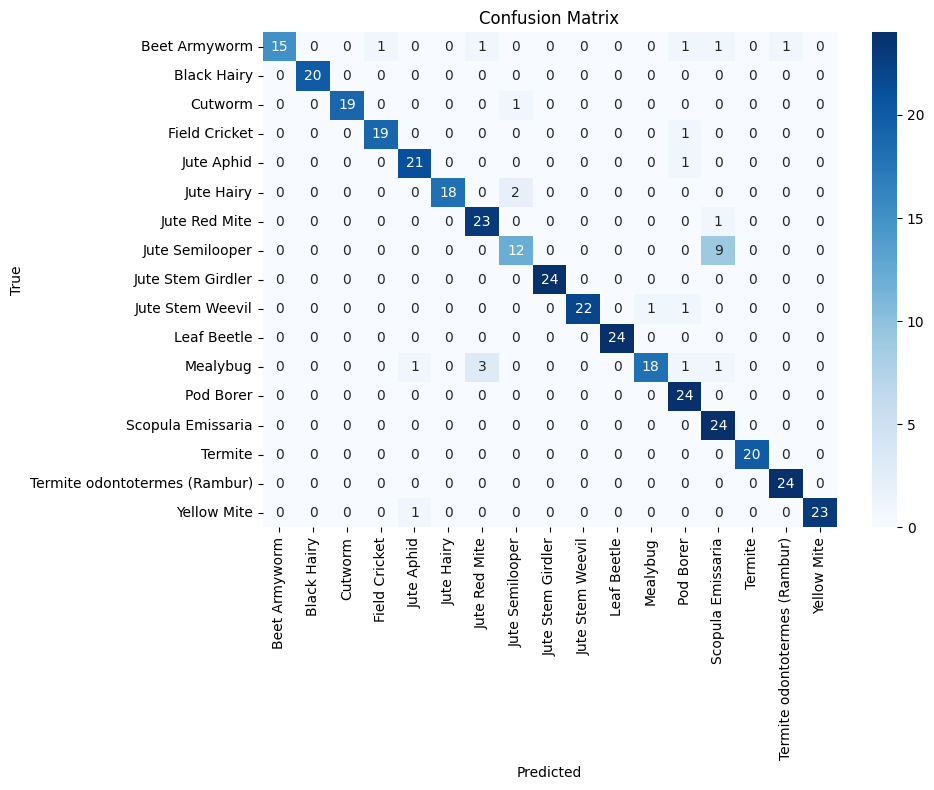


--- Sample Training Images After Erosion ---


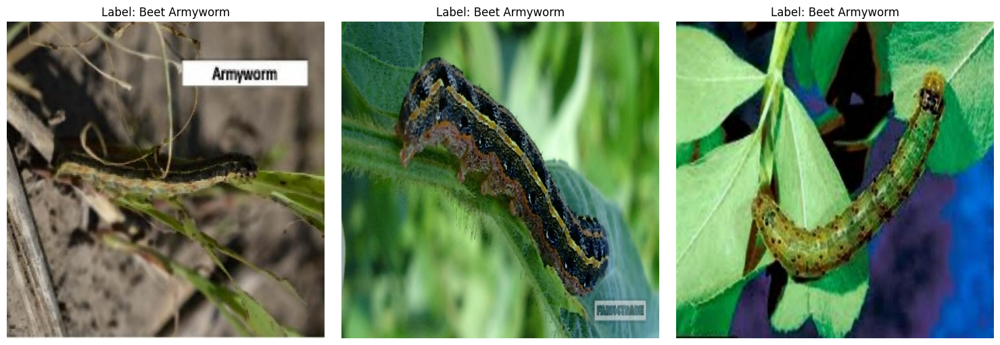

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
EROSION_DATASET_DIR = '/content/jute_pest_dataset_erosion'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Erosion (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

EROSION_TRAIN_DIR = os.path.join(EROSION_DATASET_DIR, "train")
EROSION_VAL_DIR = os.path.join(EROSION_DATASET_DIR, "val")
EROSION_TEST_DIR = os.path.join(EROSION_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(EROSION_TRAIN_DIR, exist_ok=True)
os.makedirs(EROSION_VAL_DIR, exist_ok=True)
os.makedirs(EROSION_TEST_DIR, exist_ok=True)

# Function to apply RGB Erosion
def apply_erosion(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            erosion_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(erosion_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Split the image into its RGB channels
                    b, g, r = cv2.split(img)
                    # Apply erosion to each channel
                    b_eroded = cv2.erode(b, kernel, iterations=1)
                    g_eroded = cv2.erode(g, kernel, iterations=1)
                    r_eroded = cv2.erode(r, kernel, iterations=1)
                    # Merge the eroded channels back into an RGB image
                    erosion_color = cv2.merge((b_eroded, g_eroded, r_eroded))
                    cv2.imwrite(os.path.join(erosion_class_dir, img_name), erosion_color)

# Apply Erosion to training, validation, and test sets
apply_erosion(TRAIN_DIR, EROSION_TRAIN_DIR)
apply_erosion(VAL_DIR, EROSION_VAL_DIR)
apply_erosion(TEST_DIR, EROSION_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_erosion.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(EROSION_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(EROSION_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(EROSION_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_erosion.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_erosion.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_erosion.png"))
    plt.show()

    # Show sample predictions from Erosion training dataset
    print("\n--- Sample Training Images After Erosion ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    erosion_train_dataset = JutePestDataset(EROSION_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = erosion_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {erosion_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_erosion_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_erosion.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Opening**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-5-c38417de8806>:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9233  Acc: 0.7162


Val Loss: 0.8708  Acc: 0.7797

Epoch 2/10 ====================


Train Loss: 0.4502  Acc: 0.8592


Val Loss: 0.8270  Acc: 0.8136

Epoch 3/10 ====================


Train Loss: 0.2706  Acc: 0.9168


Val Loss: 0.7676  Acc: 0.8208

Epoch 4/10 ====================


Train Loss: 0.1846  Acc: 0.9448


Val Loss: 1.0494  Acc: 0.7869

Epoch 5/10 ====================


Train Loss: 0.1570  Acc: 0.9514


Val Loss: 0.7534  Acc: 0.8644

Epoch 6/10 ====================


Train Loss: 0.1353  Acc: 0.9597


Val Loss: 0.8706  Acc: 0.8523

Epoch 7/10 ====================


Train Loss: 0.1030  Acc: 0.9687


Val Loss: 0.7824  Acc: 0.8499

Epoch 8/10 ====================


Train Loss: 0.0931  Acc: 0.9693


Val Loss: 0.9085  Acc: 0.8499

Epoch 9/10 ====================


Train Loss: 0.0863  Acc: 0.9728


Val Loss: 0.9898  Acc: 0.8523

Epoch 10/10 ====================


Train Loss: 0.0895  Acc: 0.9690


Val Loss: 0.8360  Acc: 0.8523

Training complete in 4m 39s
Best validation accuracy: 0.8644


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.91it/s]



--- Test Metrics ---
Test Accuracy : 0.9499
Precision     : 0.9513
Recall        : 0.9499
F1 Score      : 0.9481

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.93      0.65      0.76        20
                  Black Hairy       0.87      1.00      0.93        20
                      Cutworm       1.00      0.95      0.97        20
                Field Cricket       0.95      1.00      0.98        20
                   Jute Aphid       0.88      1.00      0.94        22
                   Jute Hairy       0.90      0.90      0.90        20
                Jute Red Mite       0.95      0.83      0.89        24
              Jute Semilooper       0.95      0.95      0.95        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.96      1.00      0.98        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

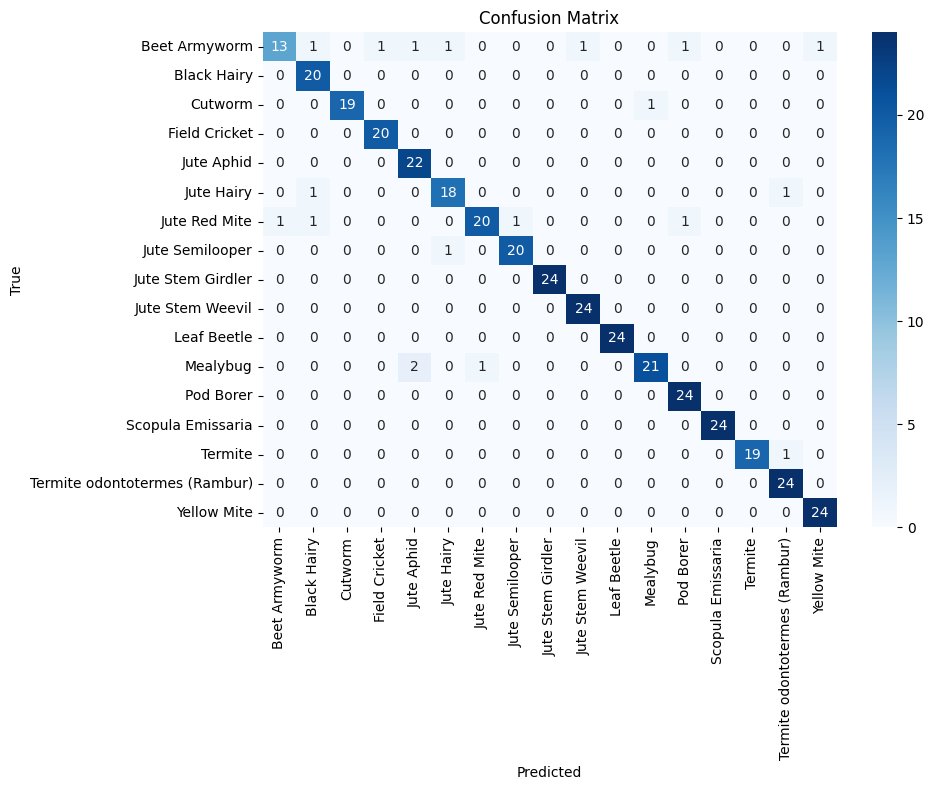


--- Sample Training Images After Opening ---


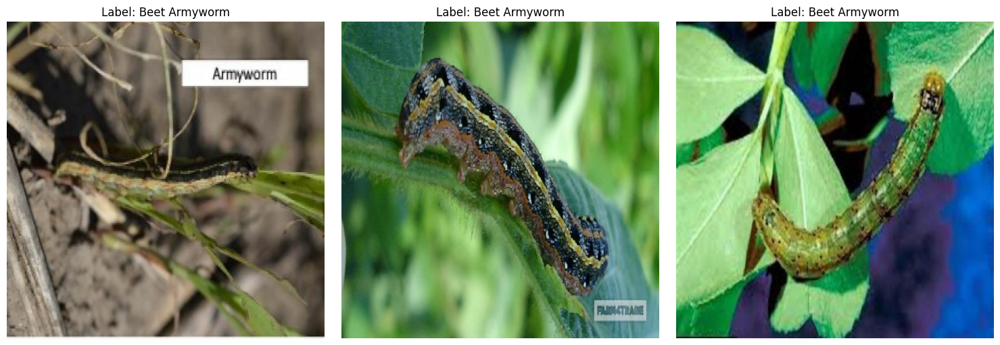

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
OPENING_DATASET_DIR = '/content/jute_pest_dataset_opening'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Opening (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

OPENING_TRAIN_DIR = os.path.join(OPENING_DATASET_DIR, "train")
OPENING_VAL_DIR = os.path.join(OPENING_DATASET_DIR, "val")
OPENING_TEST_DIR = os.path.join(OPENING_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(OPENING_TRAIN_DIR, exist_ok=True)
os.makedirs(OPENING_VAL_DIR, exist_ok=True)
os.makedirs(OPENING_TEST_DIR, exist_ok=True)

# Function to apply Opening
def apply_opening(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            opening_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(opening_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Apply Opening directly on the RGB image
                    opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1)
                    cv2.imwrite(os.path.join(opening_class_dir, img_name), opening)

# Apply Opening to training, validation, and test sets
apply_opening(TRAIN_DIR, OPENING_TRAIN_DIR)
apply_opening(VAL_DIR, OPENING_VAL_DIR)
apply_opening(TEST_DIR, OPENING_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_opening.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(OPENING_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(OPENING_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(OPENING_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_opening.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_opening.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_opening.png"))
    plt.show()

    # Show sample predictions from Opening training dataset
    print("\n--- Sample Training Images After Opening ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    opening_train_dataset = JutePestDataset(OPENING_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = opening_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {opening_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_opening_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_opening.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Closing**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-6-cdaf69bed1f5>:114: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.9417  Acc: 0.7129


Val Loss: 1.0553  Acc: 0.7337

Epoch 2/10 ====================


Train Loss: 0.4376  Acc: 0.8662


Val Loss: 0.8466  Acc: 0.7942

Epoch 3/10 ====================


Train Loss: 0.2635  Acc: 0.9221


Val Loss: 0.9580  Acc: 0.7845

Epoch 4/10 ====================


Train Loss: 0.1963  Acc: 0.9372


Val Loss: 0.8175  Acc: 0.8257

Epoch 5/10 ====================


Train Loss: 0.1778  Acc: 0.9468


Val Loss: 0.7868  Acc: 0.8208

Epoch 6/10 ====================


Train Loss: 0.1252  Acc: 0.9598


Val Loss: 0.8126  Acc: 0.8523

Epoch 7/10 ====================


Train Loss: 0.0954  Acc: 0.9700


Val Loss: 0.9387  Acc: 0.8232

Epoch 8/10 ====================


Train Loss: 0.1287  Acc: 0.9612


Val Loss: 0.8294  Acc: 0.8402

Epoch 9/10 ====================


Train Loss: 0.0817  Acc: 0.9745


Val Loss: 0.7689  Acc: 0.8765

Epoch 10/10 ====================


Train Loss: 0.0610  Acc: 0.9836


Val Loss: 0.9022  Acc: 0.8160

Training complete in 4m 57s
Best validation accuracy: 0.8765


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



--- Test Metrics ---
Test Accuracy : 0.9525
Precision     : 0.9560
Recall        : 0.9525
F1 Score      : 0.9520

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.88      0.70      0.78        20
                  Black Hairy       1.00      0.95      0.97        20
                      Cutworm       0.86      0.95      0.90        20
                Field Cricket       1.00      0.90      0.95        20
                   Jute Aphid       0.81      1.00      0.90        22
                   Jute Hairy       0.87      1.00      0.93        20
                Jute Red Mite       1.00      0.88      0.93        24
              Jute Semilooper       1.00      0.95      0.98        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.96      1.00      0.98        24
                  Leaf Beetle       1.00      1.00      1.00        24
         

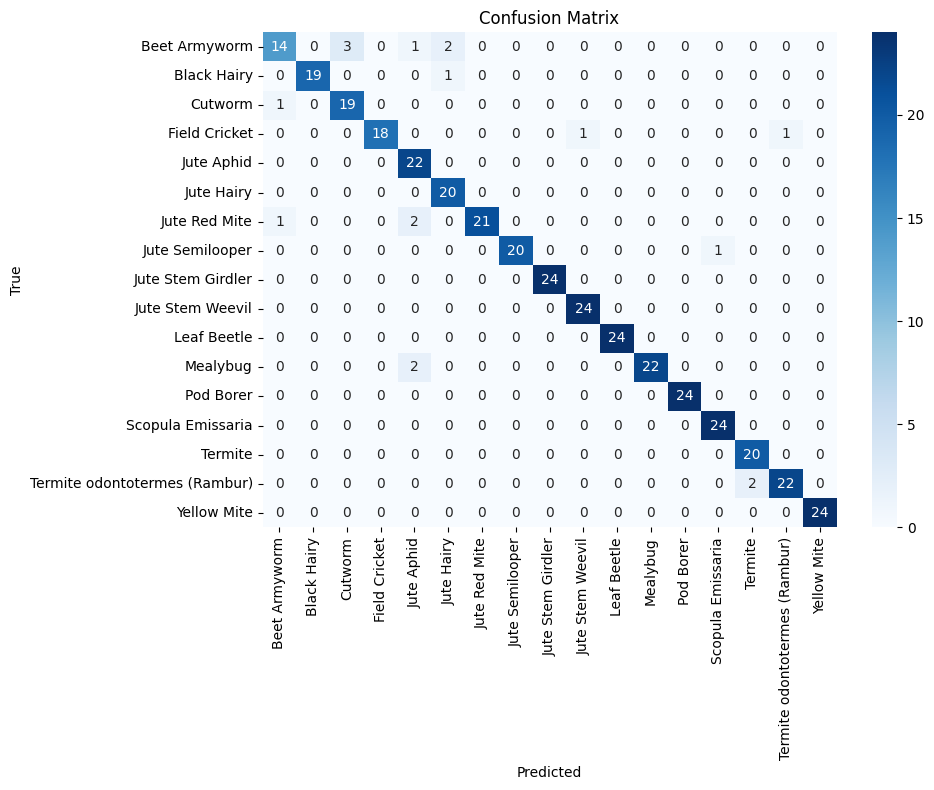


--- Sample Training Images After Closing ---


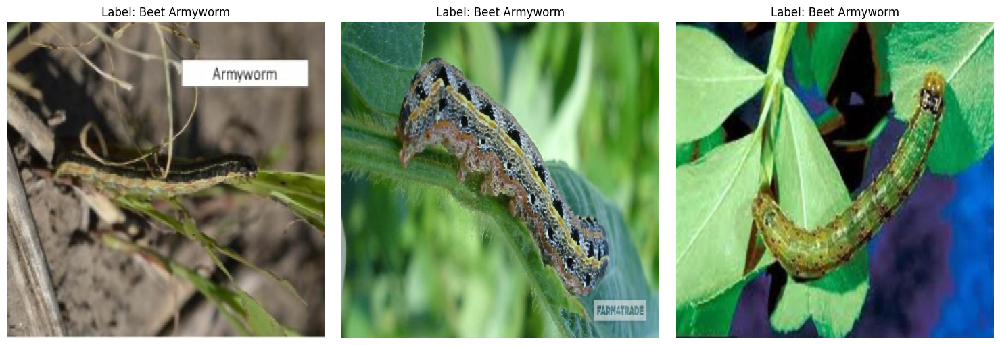

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
CLOSING_DATASET_DIR = '/content/jute_pest_dataset_closing'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Closing (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

CLOSING_TRAIN_DIR = os.path.join(CLOSING_DATASET_DIR, "train")
CLOSING_VAL_DIR = os.path.join(CLOSING_DATASET_DIR, "val")
CLOSING_TEST_DIR = os.path.join(CLOSING_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(CLOSING_TRAIN_DIR, exist_ok=True)
os.makedirs(CLOSING_VAL_DIR, exist_ok=True)
os.makedirs(CLOSING_TEST_DIR, exist_ok=True)

# Function to apply Closing
def apply_closing(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            closing_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(closing_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Apply Closing directly on the RGB image
                    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel, iterations=1)
                    cv2.imwrite(os.path.join(closing_class_dir, img_name), closing)

# Apply Closing to training, validation, and test sets
apply_closing(TRAIN_DIR, CLOSING_TRAIN_DIR)
apply_closing(VAL_DIR, CLOSING_VAL_DIR)
apply_closing(TEST_DIR, CLOSING_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_closing.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(CLOSING_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(CLOSING_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(CLOSING_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_closing.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_closing.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_closing.png"))
    plt.show()

    # Show sample predictions from Closing training dataset
    print("\n--- Sample Training Images After Closing ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    closing_train_dataset = JutePestDataset(CLOSING_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = closing_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {closing_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_closing_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_closing.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **Boundary Extraction**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-7-892e6c43b71f>:117: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: nan  Acc: 0.0487


Val Loss: nan  Acc: 0.0969

Epoch 2/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 3/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 4/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 5/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 6/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 7/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 8/10 ====================


Train Loss: nan  Acc: 0.0306


Val Loss: nan  Acc: 0.0969

Epoch 9/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Epoch 10/10 ====================


Train Loss: nan  Acc: 0.0307


Val Loss: nan  Acc: 0.0969

Training complete in 4m 40s
Best validation accuracy: 0.0969


Testing: 100%|██████████| 6/6 [00:01<00:00,  3.05it/s]



--- Test Metrics ---
Test Accuracy : 0.0554
Precision     : 0.0031
Recall        : 0.0554
F1 Score      : 0.0058

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.00      0.00      0.00        20
                  Black Hairy       0.00      0.00      0.00        20
                      Cutworm       0.00      0.00      0.00        20
                Field Cricket       0.00      0.00      0.00        20
                   Jute Aphid       0.00      0.00      0.00        22
                   Jute Hairy       0.00      0.00      0.00        20
                Jute Red Mite       0.00      0.00      0.00        24
              Jute Semilooper       0.06      1.00      0.10        21
            Jute Stem Girdler       0.00      0.00      0.00        24
             Jute Stem Weevil       0.00      0.00      0.00        24
                  Leaf Beetle       0.00      0.00      0.00        24
         

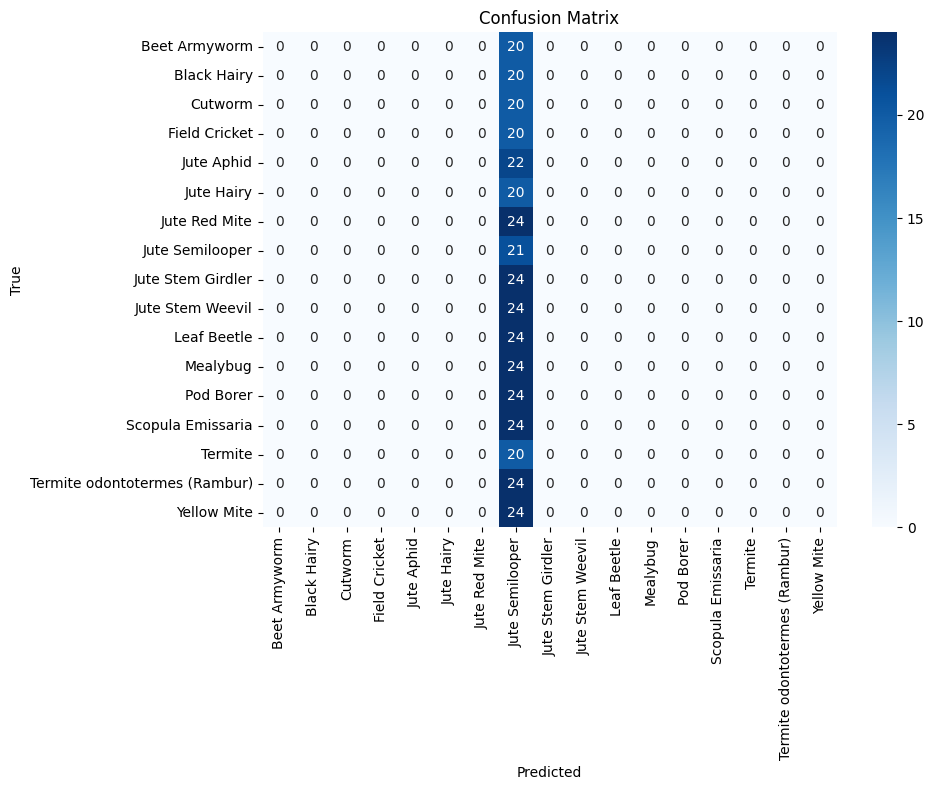


--- Sample Training Images After Boundary Extraction ---


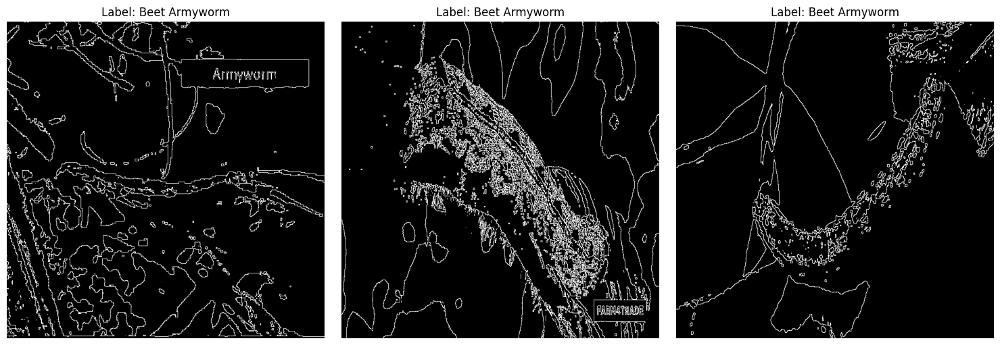

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
BOUNDARY_DATASET_DIR = '/content/jute_pest_dataset_boundary'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Boundary Extraction (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

BOUNDARY_TRAIN_DIR = os.path.join(BOUNDARY_DATASET_DIR, "train")
BOUNDARY_VAL_DIR = os.path.join(BOUNDARY_DATASET_DIR, "val")
BOUNDARY_TEST_DIR = os.path.join(BOUNDARY_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(BOUNDARY_TRAIN_DIR, exist_ok=True)
os.makedirs(BOUNDARY_VAL_DIR, exist_ok=True)
os.makedirs(BOUNDARY_TEST_DIR, exist_ok=True)

# Function to apply Boundary Extraction
def apply_boundary_extraction(src_dir, dest_dir):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            boundary_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(boundary_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)
                    dilation = cv2.dilate(thresh, kernel, iterations=1)
                    boundary = cv2.bitwise_xor(dilation, thresh)
                    boundary_color = cv2.cvtColor(boundary, cv2.COLOR_GRAY2BGR)
                    cv2.imwrite(os.path.join(boundary_class_dir, img_name), boundary_color)

# Apply Boundary Extraction to training, validation, and test sets
apply_boundary_extraction(TRAIN_DIR, BOUNDARY_TRAIN_DIR)
apply_boundary_extraction(VAL_DIR, BOUNDARY_VAL_DIR)
apply_boundary_extraction(TEST_DIR, BOUNDARY_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_boundary.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(BOUNDARY_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(BOUNDARY_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(BOUNDARY_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_boundary.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_boundary.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_boundary.png"))
    plt.show()

    # Show sample predictions from Boundary Extraction training dataset
    print("\n--- Sample Training Images After Boundary Extraction ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    boundary_train_dataset = JutePestDataset(BOUNDARY_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = boundary_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {boundary_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_boundary_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_boundary.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **FFT low pass**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-8-837309993429>:129: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 1.7907  Acc: 0.4368


Val Loss: 1.6409  Acc: 0.4818

Epoch 2/10 ====================


Train Loss: 1.0246  Acc: 0.6775


Val Loss: 1.5888  Acc: 0.5738

Epoch 3/10 ====================


Train Loss: 0.6785  Acc: 0.7876


Val Loss: 1.2257  Acc: 0.6925

Epoch 4/10 ====================


Train Loss: 0.5077  Acc: 0.8394


Val Loss: 1.3304  Acc: 0.6707

Epoch 5/10 ====================


Train Loss: 0.4184  Acc: 0.8670


Val Loss: 1.1786  Acc: 0.6659

Epoch 6/10 ====================


Train Loss: 0.3707  Acc: 0.8849


Val Loss: 1.4626  Acc: 0.6102

Epoch 7/10 ====================


Train Loss: 0.2889  Acc: 0.9091


Val Loss: 1.2976  Acc: 0.6804

Epoch 8/10 ====================


Train Loss: 0.2644  Acc: 0.9164


Val Loss: 1.2578  Acc: 0.7167

Epoch 9/10 ====================


Train Loss: 0.1854  Acc: 0.9401


Val Loss: 1.4263  Acc: 0.7215

Epoch 10/10 ====================


Train Loss: 0.2137  Acc: 0.9306


Val Loss: 1.5027  Acc: 0.7022

Training complete in 4m 37s
Best validation accuracy: 0.7215


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.57it/s]



--- Test Metrics ---
Test Accuracy : 0.8179
Precision     : 0.8361
Recall        : 0.8179
F1 Score      : 0.8110

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.68      0.65      0.67        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       0.85      0.85      0.85        20
                Field Cricket       0.86      0.95      0.90        20
                   Jute Aphid       0.65      0.91      0.75        22
                   Jute Hairy       0.52      0.85      0.64        20
                Jute Red Mite       0.85      0.71      0.77        24
              Jute Semilooper       0.60      0.29      0.39        21
            Jute Stem Girdler       0.96      1.00      0.98        24
             Jute Stem Weevil       0.86      0.75      0.80        24
                  Leaf Beetle       0.96      1.00      0.98        24
         

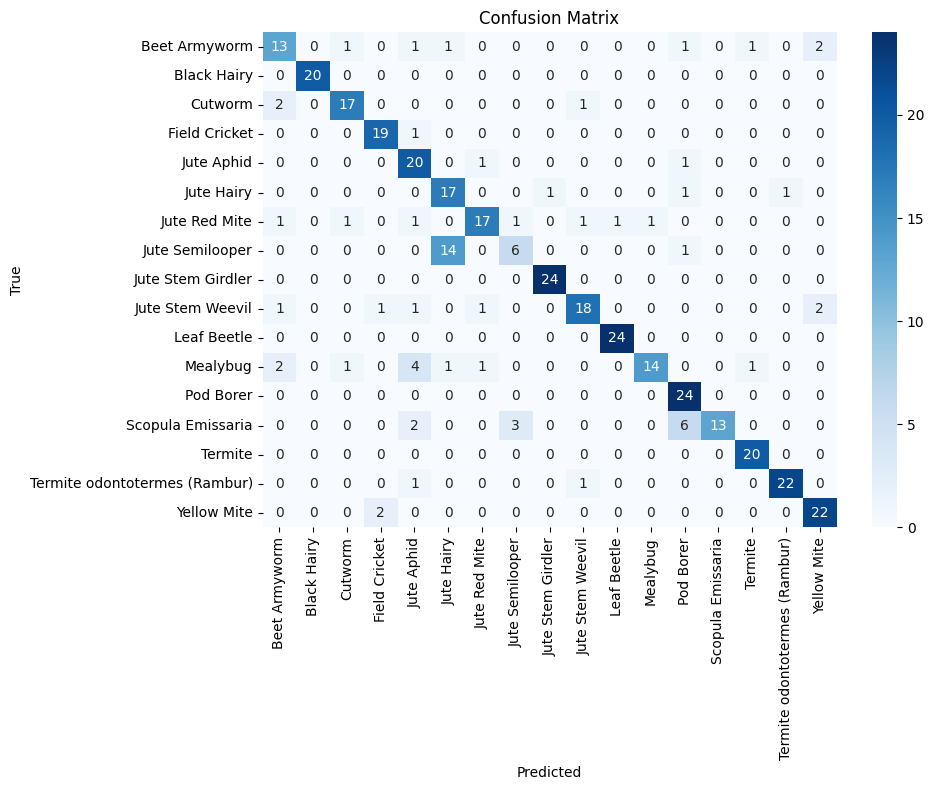


--- Sample Training Images After Fourier Transform Filtering (Low-Pass) ---


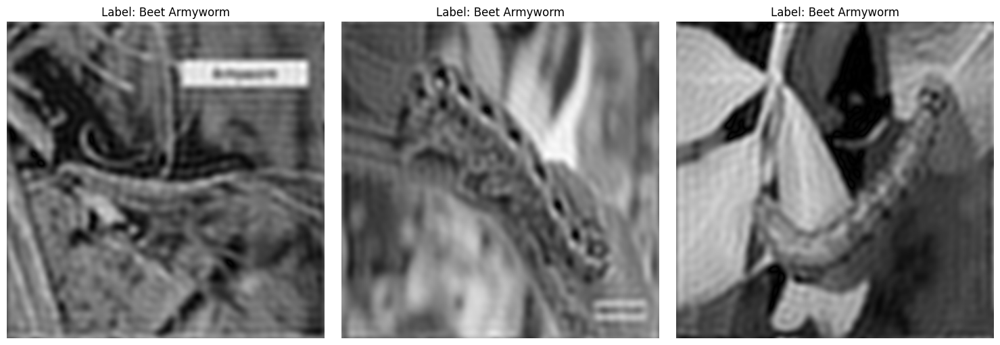

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import numpy as np
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
FOURIER_DATASET_DIR = '/content/jute_pest_dataset_fourier'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Fourier Transform Filtering (Low-Pass) (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

FOURIER_TRAIN_DIR = os.path.join(FOURIER_DATASET_DIR, "train")
FOURIER_VAL_DIR = os.path.join(FOURIER_DATASET_DIR, "val")
FOURIER_TEST_DIR = os.path.join(FOURIER_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(FOURIER_TRAIN_DIR, exist_ok=True)
os.makedirs(FOURIER_VAL_DIR, exist_ok=True)
os.makedirs(FOURIER_TEST_DIR, exist_ok=True)

# Function to apply Fourier Transform Filtering (Low-Pass)
def apply_fourier_low_pass(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            fourier_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(fourier_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                    f = np.fft.fft2(img)
                    fshift = np.fft.fftshift(f)
                    rows, cols = img.shape
                    crow, ccol = rows // 2, cols // 2
                    mask = np.zeros((rows, cols), np.uint8)
                    r = 30  # Radius of the low-pass filter
                    center = [crow, ccol]
                    x, y = np.ogrid[:rows, :cols]
                    mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
                    mask[mask_area] = 1
                    fshift = fshift * mask
                    ishift = np.fft.ifftshift(fshift)
                    img_back = np.fft.ifft2(ishift)
                    img_back = np.abs(img_back)
                    img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
                    img_back = np.uint8(img_back)
                    img_back_color = cv2.cvtColor(img_back, cv2.COLOR_GRAY2BGR)
                    cv2.imwrite(os.path.join(fourier_class_dir, img_name), img_back_color)

# Apply Fourier Transform Filtering (Low-Pass) to training, validation, and test sets
apply_fourier_low_pass(TRAIN_DIR, FOURIER_TRAIN_DIR)
apply_fourier_low_pass(VAL_DIR, FOURIER_VAL_DIR)
apply_fourier_low_pass(TEST_DIR, FOURIER_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_fourier.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(FOURIER_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(FOURIER_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(FOURIER_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_fourier.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_fourier.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_fourier.png"))
    plt.show()

    # Show sample predictions from Fourier Transform Filtering (Low-Pass) training dataset
    print("\n--- Sample Training Images After Fourier Transform Filtering (Low-Pass) ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fourier_train_dataset = JutePestDataset(FOURIER_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = fourier_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {fourier_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_fourier_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_fourier.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **FFT High Pass**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe


Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-11-c0be6f0097db>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: nan  Acc: 0.0714


Val Loss: nan  Acc: 0.0969

Epoch 2/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 3/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 4/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 5/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 6/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 7/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 8/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 9/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Epoch 10/10 ====================


Train Loss: nan  Acc: 0.0309


Val Loss: nan  Acc: 0.0969

Training complete in 4m 50s
Best validation accuracy: 0.0969


Testing: 100%|██████████| 6/6 [00:02<00:00,  2.18it/s]



--- Test Metrics ---
Test Accuracy : 0.0633
Precision     : 0.0040
Recall        : 0.0633
F1 Score      : 0.0075

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.00      0.00      0.00        20
                  Black Hairy       0.00      0.00      0.00        20
                      Cutworm       0.00      0.00      0.00        20
                Field Cricket       0.00      0.00      0.00        20
                   Jute Aphid       0.00      0.00      0.00        22
                   Jute Hairy       0.00      0.00      0.00        20
                Jute Red Mite       0.00      0.00      0.00        24
              Jute Semilooper       0.00      0.00      0.00        21
            Jute Stem Girdler       0.00      0.00      0.00        24
             Jute Stem Weevil       0.00      0.00      0.00        24
                  Leaf Beetle       0.00      0.00      0.00        24
         

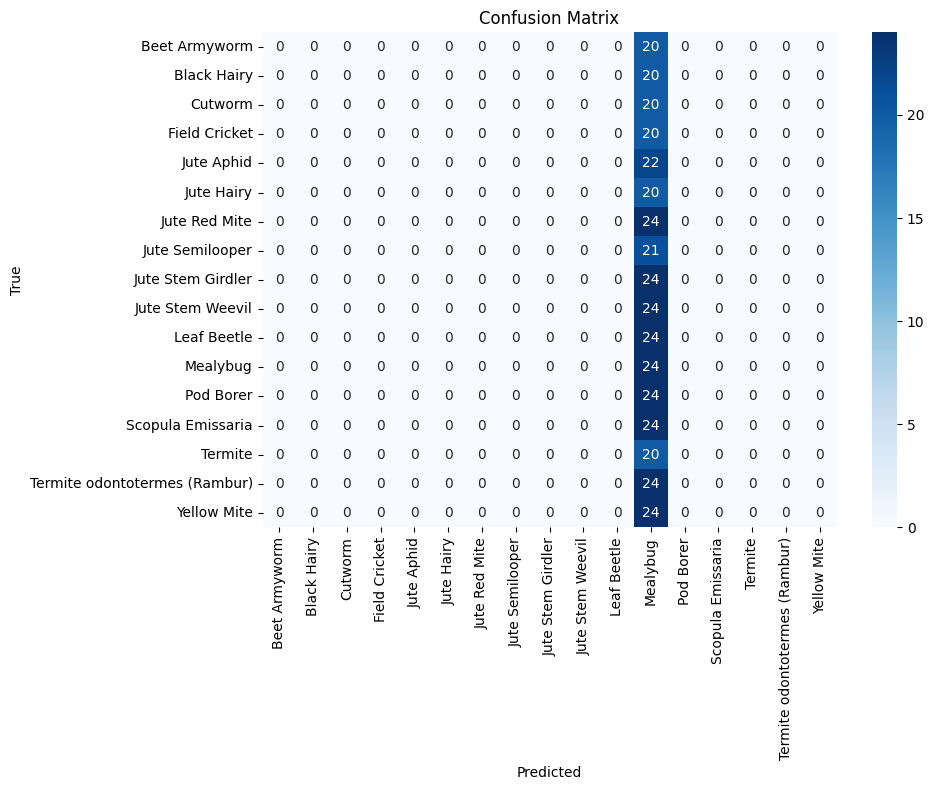


--- Sample Training Images After Fourier Transform Filtering (High-Pass) ---


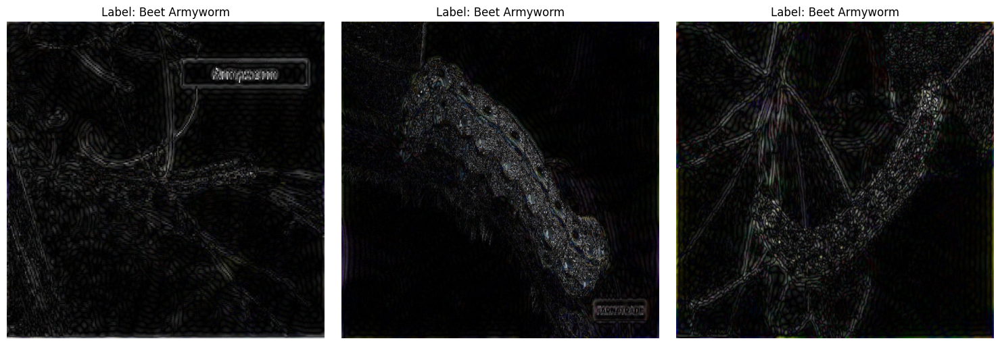

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import numpy as np
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
FOURIER_HIGH_PASS_DATASET_DIR = '/content/jute_pest_dataset_fourier_high_pass'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Fourier Transform Filtering (High-Pass) (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

FOURIER_HIGH_PASS_TRAIN_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "train")
FOURIER_HIGH_PASS_VAL_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "val")
FOURIER_HIGH_PASS_TEST_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(FOURIER_HIGH_PASS_TRAIN_DIR, exist_ok=True)
os.makedirs(FOURIER_HIGH_PASS_VAL_DIR, exist_ok=True)
os.makedirs(FOURIER_HIGH_PASS_TEST_DIR, exist_ok=True)

# Function to apply Fourier Transform Filtering (High-Pass)
def apply_fourier_high_pass(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            fourier_high_pass_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(fourier_high_pass_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Apply Fourier Transform to each color channel separately
                    channels = list(cv2.split(img))  # Convert tuple to list
                    for i in range(3):  # Iterate over each channel (B, G, R)
                        f = np.fft.fft2(channels[i])
                        fshift = np.fft.fftshift(f)
                        rows, cols = channels[i].shape
                        crow, ccol = rows // 2, cols // 2
                        mask = np.ones((rows, cols), np.uint8)
                        r = 30  # Radius of the high-pass filter
                        center = [crow, ccol]
                        x, y = np.ogrid[:rows, :cols]
                        mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
                        mask[mask_area] = 0
                        fshift = fshift * mask
                        ishift = np.fft.ifftshift(fshift)
                        img_back = np.fft.ifft2(ishift)
                        img_back = np.abs(img_back)
                        img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
                        channels[i] = np.uint8(img_back)
                    # Merge the channels back into an RGB image
                    img_back_color = cv2.merge(channels)
                    cv2.imwrite(os.path.join(fourier_high_pass_class_dir, img_name), img_back_color)

# Apply Fourier Transform Filtering (High-Pass) to training, validation, and test sets
apply_fourier_high_pass(TRAIN_DIR, FOURIER_HIGH_PASS_TRAIN_DIR)
apply_fourier_high_pass(VAL_DIR, FOURIER_HIGH_PASS_VAL_DIR)
apply_fourier_high_pass(TEST_DIR, FOURIER_HIGH_PASS_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_fourier_high_pass.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(FOURIER_HIGH_PASS_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(FOURIER_HIGH_PASS_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(FOURIER_HIGH_PASS_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: AlexNet
    model = models.alexnet(pretrained=True)
    model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_fourier_high_pass.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_fourier_high_pass.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_fourier_high_pass.png"))
    plt.show()

    # Show sample predictions from Fourier Transform Filtering (High-Pass) training dataset
    print("\n--- Sample Training Images After Fourier Transform Filtering (High-Pass) ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fourier_high_pass_train_dataset = JutePestDataset(FOURIER_HIGH_PASS_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = fourier_high_pass_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {fourier_high_pass_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_fourier_high_pass_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_fourier_high_pass.json"), "w") as f:
        json.dump(training_logs, f, indent=4)

# **FFT High pass sharpen**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0



<ipython-input-4-1a84b7a56c5d>:213: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()



Epoch 1/10 ====================


Train 1:   0%|          | 0/101 [00:00<?, ?it/s]<ipython-input-4-1a84b7a56c5d>:133: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Train Loss: 0.7623  Acc: 0.7731


Val Loss: 0.8059  Acc: 0.7482

Epoch 2/10 ====================


Train Loss: 0.1289  Acc: 0.9612


Val Loss: 0.7212  Acc: 0.7966

Epoch 3/10 ====================


Train Loss: 0.0758  Acc: 0.9761


Val Loss: 0.5456  Acc: 0.8547

Epoch 4/10 ====================


Train Loss: 0.0464  Acc: 0.9853


Val Loss: 0.6674  Acc: 0.8329

Epoch 5/10 ====================


Train Loss: 0.0292  Acc: 0.9905


Val Loss: 0.5731  Acc: 0.8668

Epoch 6/10 ====================


Train Loss: 0.0239  Acc: 0.9915


Val Loss: 0.4955  Acc: 0.8838

Epoch 7/10 ====================


Train Loss: 0.0388  Acc: 0.9877


Val Loss: 1.0151  Acc: 0.7772

Epoch 8/10 ====================


Train Loss: 0.0536  Acc: 0.9832


Val Loss: 0.5819  Acc: 0.8571

Epoch 9/10 ====================


Train Loss: 0.0135  Acc: 0.9963


Val Loss: 0.5376  Acc: 0.8644

Epoch 10/10 ====================


Train Loss: 0.0122  Acc: 0.9964


Val Loss: 0.6274  Acc: 0.8692

Training complete in 6m 11s
Best validation accuracy: 0.8838


Testing: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]



--- Test Metrics ---
Test Accuracy : 0.9288
Precision     : 0.9353
Recall        : 0.9288
F1 Score      : 0.9278

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.68      0.95      0.79        20
                  Black Hairy       1.00      1.00      1.00        20
                      Cutworm       0.78      0.70      0.74        20
                Field Cricket       1.00      1.00      1.00        20
                   Jute Aphid       0.94      0.73      0.82        22
                   Jute Hairy       0.86      0.95      0.90        20
                Jute Red Mite       0.81      0.92      0.86        24
              Jute Semilooper       0.93      0.67      0.78        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       0.92      1.00      0.96        24
                  Leaf Beetle       0.96      1.00      0.98        24
         

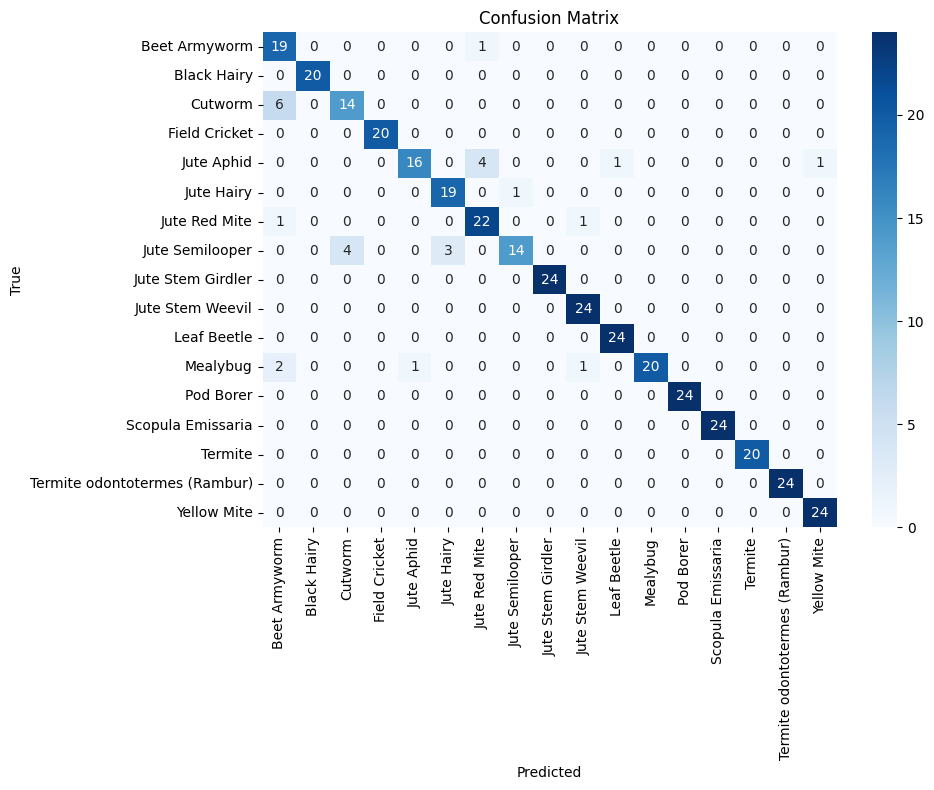


--- Sample Training Images After Fourier Transform Filtering (High-Pass) ---


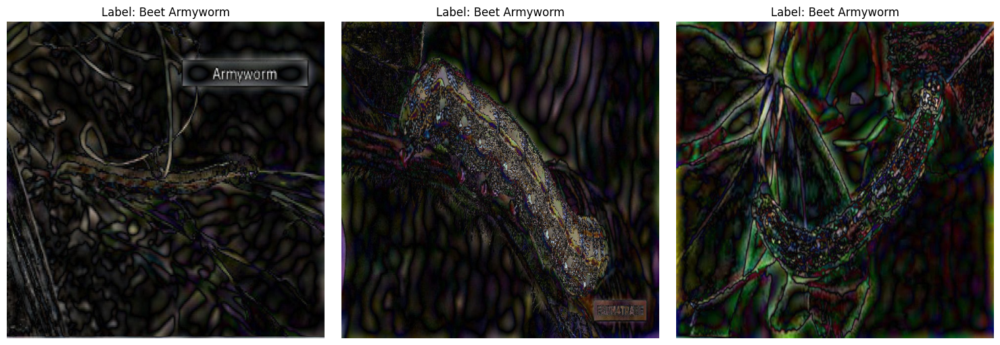

In [ ]:
# Google Colab: Mount Drive
from google.colab import drive
drive.mount('/content/drive')

import os
import cv2
import numpy as np
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

# Paths
ORIGINAL_DATASET_DIR = '/content/drive/MyDrive/Jute_Pest_Dataset'
FOURIER_HIGH_PASS_DATASET_DIR = '/content/jute_pest_dataset_fourier_high_pass'
BASE_DIR = '/content/jute_pest_dataset'

# Copy original dataset to local directory
os.makedirs(BASE_DIR, exist_ok=True)
!cp -r {ORIGINAL_DATASET_DIR}/* {BASE_DIR}/

# Apply Fourier Transform Filtering (High-Pass) (to training, validation, and test images)
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "val")
TEST_DIR = os.path.join(BASE_DIR, "test")

FOURIER_HIGH_PASS_TRAIN_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "train")
FOURIER_HIGH_PASS_VAL_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "val")
FOURIER_HIGH_PASS_TEST_DIR = os.path.join(FOURIER_HIGH_PASS_DATASET_DIR, "test")

# Create directories for processed images
os.makedirs(FOURIER_HIGH_PASS_TRAIN_DIR, exist_ok=True)
os.makedirs(FOURIER_HIGH_PASS_VAL_DIR, exist_ok=True)
os.makedirs(FOURIER_HIGH_PASS_TEST_DIR, exist_ok=True)

# Function to apply Fourier Transform Filtering (High-Pass)
def apply_fourier_high_pass(src_dir, dest_dir):
    for class_name in os.listdir(src_dir):
        class_dir = os.path.join(src_dir, class_name)
        if os.path.isdir(class_dir):
            fourier_high_pass_class_dir = os.path.join(dest_dir, class_name)
            os.makedirs(fourier_high_pass_class_dir, exist_ok=True)
            for img_name in os.listdir(class_dir):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    # Apply Fourier Transform to each color channel separately
                    channels = list(cv2.split(img))  # Convert tuple to list
                    for i in range(3):  # Iterate over each channel (B, G, R)
                        f = np.fft.fft2(channels[i])
                        fshift = np.fft.fftshift(f)
                        rows, cols = channels[i].shape
                        crow, ccol = rows // 2, cols // 2
                        mask = np.ones((rows, cols), np.uint8)
                        r = 10  # Smaller radius for less aggressive filtering
                        center = [crow, ccol]
                        x, y = np.ogrid[:rows, :cols]
                        mask_area = (x - center[0]) ** 2 + (y - center[1]) ** 2 <= r*r
                        mask[mask_area] = 0
                        fshift = fshift * mask
                        ishift = np.fft.ifftshift(fshift)
                        img_back = np.fft.ifft2(ishift)
                        img_back = np.abs(img_back)
                        img_back = cv2.normalize(img_back, None, 0, 255, cv2.NORM_MINMAX)
                        channels[i] = np.uint8(img_back)
                    # Merge the channels back into an RGB image
                    img_back_color = cv2.merge(channels)
                    cv2.imwrite(os.path.join(fourier_high_pass_class_dir, img_name), img_back_color)

# Apply Fourier Transform Filtering (High-Pass) to training, validation, and test sets
apply_fourier_high_pass(TRAIN_DIR, FOURIER_HIGH_PASS_TRAIN_DIR)
apply_fourier_high_pass(VAL_DIR, FOURIER_HIGH_PASS_VAL_DIR)
apply_fourier_high_pass(TEST_DIR, FOURIER_HIGH_PASS_TEST_DIR)

# Dataset Class
class JutePestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.samples = []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            if os.path.isdir(cls_dir):
                for img_name in os.listdir(cls_dir):
                    if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        img_path = os.path.join(cls_dir, img_name)
                        self.samples.append((img_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Training Function
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, device=torch.device("cpu")):
    since = time.time()
    best_acc = 0.0
    logs = {"train": [], "val": []}
    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch+1}/{num_epochs} " + "="*20)
        for phase in ["train", "val"]:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0
            pbar = tqdm(dataloaders[phase], desc=f"{phase.capitalize()} {epoch+1}", leave=False)
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == "train"):
                    with torch.cuda.amp.autocast():
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)
                    if phase == "train":
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                pbar.set_postfix(loss=f"{loss.item():.4f}")
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            logs[phase].append({"epoch": epoch, "loss": epoch_loss, "accuracy": epoch_acc.item()})
            print(f"{phase.capitalize()} Loss: {epoch_loss:.4f}  Acc: {epoch_acc:.4f}")
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                torch.save(model.state_dict(), os.path.join(BASE_DIR, "alexnet_best_jute_pest_model_fourier_high_pass.pth"))
    time_elapsed = time.time() - since
    print(f"\nTraining complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
    print(f"Best validation accuracy: {best_acc:.4f}")
    return model, logs

# Main
if __name__ == "__main__":
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}\n")
    torch.backends.cudnn.benchmark = True

    # Transforms
    data_transforms = {
        "train": transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "val": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        "test": transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.PILToTensor(),
            transforms.ConvertImageDtype(torch.float32),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
    }

    datasets = {
        "train": JutePestDataset(FOURIER_HIGH_PASS_TRAIN_DIR, transform=data_transforms["train"]),
        "val": JutePestDataset(FOURIER_HIGH_PASS_VAL_DIR, transform=data_transforms["val"]),
        "test": JutePestDataset(FOURIER_HIGH_PASS_TEST_DIR, transform=data_transforms["test"])
    }

    batch_size = 64
    num_workers = 8
    dataloaders = {
        "train": DataLoader(datasets["train"], batch_size=batch_size, shuffle=True,
                            num_workers=num_workers, pin_memory=True),
        "val": DataLoader(datasets["val"], batch_size=batch_size, shuffle=False,
                          num_workers=num_workers, pin_memory=True),
        "test": DataLoader(datasets["test"], batch_size=batch_size, shuffle=False,
                           num_workers=num_workers, pin_memory=True)
    }

    # Model: ResNet50 (more advanced than AlexNet)
    model = models.resnet50(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, len(datasets["train"].classes))
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)
    scaler = torch.cuda.amp.GradScaler()

    model, training_logs = train_model(
        model=model,
        dataloaders=dataloaders,
        criterion=criterion,
        optimizer=optimizer,
        num_epochs=10,
        device=device
    )

    torch.save(model.state_dict(), os.path.join(BASE_DIR, "final_jute_pest_model_fourier_high_pass.pth"))

    # Test
    model.eval()
    all_preds = []
    all_labels = []
    test_results = []
    correct = 0
    total = 0
    sample_idx = 0
    with torch.no_grad():
        for images, labels in tqdm(dataloaders["test"], desc="Testing"):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            for i in range(len(labels)):
                test_results.append({
                    "image_path": datasets["test"].samples[sample_idx][0],
                    "true_label": datasets["test"].classes[labels[i].item()],
                    "predicted_label": datasets["test"].classes[predicted[i].item()]
                })
                sample_idx += 1

    with open(os.path.join(BASE_DIR, "alexnet_test_results_fourier_high_pass.json"), "w") as f:
        json.dump(test_results, f, indent=4)

    print("\n--- Test Metrics ---")
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    print(f"Test Accuracy : {acc:.4f}")
    print(f"Precision     : {prec:.4f}")
    print(f"Recall        : {rec:.4f}")
    print(f"F1 Score      : {f1:.4f}")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=datasets["test"].classes, zero_division=0))

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=datasets["test"].classes,
                yticklabels=datasets["test"].classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_confusion_matrix_fourier_high_pass.png"))
    plt.show()

    # Show sample predictions from Fourier Transform Filtering (High-Pass) training dataset
    print("\n--- Sample Training Images After Fourier Transform Filtering (High-Pass) ---")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fourier_high_pass_train_dataset = JutePestDataset(FOURIER_HIGH_PASS_TRAIN_DIR, transform=data_transforms["train"])
    for i, ax in enumerate(axes):
        img_path, label = fourier_high_pass_train_dataset.samples[i]
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {fourier_high_pass_train_dataset.classes[label]}")
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(os.path.join(BASE_DIR, "alexnet_sample_fourier_high_pass_train.png"))
    plt.show()

    with open(os.path.join(BASE_DIR, "alexnet_training_logs_fourier_high_pass.json"), "w") as f:
        json.dump(training_logs, f, indent=4)